In [1]:
import pandas as pd


In [2]:
df = pd.read_csv('loan.csv',low_memory=False)

In [3]:
df.shape

(39717, 111)

Null value analysis


In [4]:
df = df.loc[:,df.isnull().sum() != len(df)]

In [5]:
df.shape

(39717, 57)

In [6]:
df.isna().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12942
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths              

In [7]:
df = df.drop(['desc','mths_since_last_delinq','mths_since_last_record','next_pymnt_d'],axis=1)

In [8]:
df.shape

(39717, 53)

In [9]:
df.isna().sum()

id                               0
member_id                        0
loan_amnt                        0
funded_amnt                      0
funded_amnt_inv                  0
term                             0
int_rate                         0
installment                      0
grade                            0
sub_grade                        0
emp_title                     2459
emp_length                    1075
home_ownership                   0
annual_inc                       0
verification_status              0
issue_d                          0
loan_status                      0
pymnt_plan                       0
url                              0
purpose                          0
title                           11
zip_code                         0
addr_state                       0
dti                              0
delinq_2yrs                      0
earliest_cr_line                 0
inq_last_6mths                   0
open_acc                         0
pub_rec             

In [10]:
df.tax_liens.value_counts()

tax_liens
0.0    39678
Name: count, dtype: int64

In [11]:
df.tax_liens =  df.tax_liens.fillna(0.0)

In [12]:
df.tax_liens.value_counts()

tax_liens
0.0    39717
Name: count, dtype: int64

In [13]:
df.chargeoff_within_12_mths.value_counts()

chargeoff_within_12_mths
0.0    39661
Name: count, dtype: int64

In [14]:
df.chargeoff_within_12_mths = df.chargeoff_within_12_mths.fillna(0.0)

In [15]:
df.chargeoff_within_12_mths.value_counts()

chargeoff_within_12_mths
0.0    39717
Name: count, dtype: int64

In [16]:
df.collections_12_mths_ex_med.value_counts()

collections_12_mths_ex_med
0.0    39661
Name: count, dtype: int64

In [17]:
df.collections_12_mths_ex_med = df.collections_12_mths_ex_med.fillna(0.0)

In [18]:
df.chargeoff_within_12_mths.value_counts()

chargeoff_within_12_mths
0.0    39717
Name: count, dtype: int64

In [19]:
df.last_pymnt_d

0        Jan-15
1        Apr-13
2        Jun-14
3        Jan-15
4        May-16
          ...  
39712    Jul-10
39713    Jul-10
39714    Apr-08
39715    Jan-08
39716    Jun-10
Name: last_pymnt_d, Length: 39717, dtype: object

In [20]:
df.revol_util.value_counts().sort_values()

revol_util
37.63%      1
33.29%      1
58.19%      1
5.34%       1
6.75%       1
         ... 
0.10%      58
40.70%     58
63%        62
0.20%      63
0%        977
Name: count, Length: 1089, dtype: int64

In [21]:
df = df[~df.revol_util.isna()]

In [22]:
df.isna().sum()

id                               0
member_id                        0
loan_amnt                        0
funded_amnt                      0
funded_amnt_inv                  0
term                             0
int_rate                         0
installment                      0
grade                            0
sub_grade                        0
emp_title                     2455
emp_length                    1072
home_ownership                   0
annual_inc                       0
verification_status              0
issue_d                          0
loan_status                      0
pymnt_plan                       0
url                              0
purpose                          0
title                           11
zip_code                         0
addr_state                       0
dti                              0
delinq_2yrs                      0
earliest_cr_line                 0
inq_last_6mths                   0
open_acc                         0
pub_rec             

# Nulls are removed, now will clean the data

In [23]:
df.columns    

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [24]:
df.columns = df.columns.str.strip()

In [25]:
for c in df.columns:
    if(len(df[c].value_counts()) > 1):
       print(len(df[c].value_counts()))

39667
39667
884
1040
8195
2
371
15363
7
35
28781
11
5
5313
3
55
3
39667
14
19583
823
50
2868
11
526
9
40
5
21711
1089
82
1137
1138
37800
37470
7963
35105
1353
4026
2610
101
34901
106
3


In [26]:
for c in df.columns:
    if(len(df[c].value_counts()) <= 1):
       df.drop(c,axis=1,inplace=True)

In [27]:
df.shape

(39667, 44)

we can drop any column that may not be needed for analysis

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39667 entries, 0 to 39716
Data columns (total 44 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       39667 non-null  int64  
 1   member_id                39667 non-null  int64  
 2   loan_amnt                39667 non-null  int64  
 3   funded_amnt              39667 non-null  int64  
 4   funded_amnt_inv          39667 non-null  float64
 5   term                     39667 non-null  object 
 6   int_rate                 39667 non-null  object 
 7   installment              39667 non-null  float64
 8   grade                    39667 non-null  object 
 9   sub_grade                39667 non-null  object 
 10  emp_title                37212 non-null  object 
 11  emp_length               38595 non-null  object 
 12  home_ownership           39667 non-null  object 
 13  annual_inc               39667 non-null  float64
 14  verification_status      39

In [29]:
df.last_credit_pull_d.value_counts()

last_credit_pull_d
May-16    10302
Apr-16     2546
Mar-16     1121
Feb-13      842
Feb-16      736
          ...  
May-08        1
Jun-08        1
Jul-08        1
May-07        1
Jul-07        1
Name: count, Length: 106, dtype: int64

In [30]:
df = df.drop(['id','member_id','url','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','recoveries','total_rec_late_fee','total_rec_int','total_rec_prncp','total_pymnt_inv','total_pymnt','out_prncp_inv','out_prncp','issue_d','funded_amnt','funded_amnt_inv'],axis=1)

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39667 entries, 0 to 39716
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39667 non-null  int64  
 1   term                  39667 non-null  object 
 2   int_rate              39667 non-null  object 
 3   installment           39667 non-null  float64
 4   grade                 39667 non-null  object 
 5   sub_grade             39667 non-null  object 
 6   emp_title             37212 non-null  object 
 7   emp_length            38595 non-null  object 
 8   home_ownership        39667 non-null  object 
 9   annual_inc            39667 non-null  float64
 10  verification_status   39667 non-null  object 
 11  loan_status           39667 non-null  object 
 12  purpose               39667 non-null  object 
 13  title                 39656 non-null  object 
 14  zip_code              39667 non-null  object 
 15  addr_state            39

## change data types whereever necessary

 int_rate , earliest_cr_line, revol_util should be checked if they can be changed to int,float,  date time

In [32]:
df.int_rate.value_counts()

int_rate
10.99%    956
13.49%    826
11.49%    825
7.51%     787
7.88%     725
         ... 
17.34%      1
16.71%      1
16.15%      1
18.36%      1
14.67%      1
Name: count, Length: 371, dtype: int64

In [33]:
df.int_rate = df.int_rate.apply(lambda x: float(x.replace('%','')))

In [34]:
df.revol_util.value_counts()

revol_util
0%        977
0.20%      63
63%        62
40.70%     58
66.70%     58
         ... 
0.75%       1
2.64%       1
81.31%      1
26.33%      1
7.28%       1
Name: count, Length: 1089, dtype: int64

In [35]:
df.revol_util = df.revol_util.apply(lambda x: float(x.replace('%','')))

In [36]:
df.earliest_cr_line

0        Jan-85
1        Apr-99
2        Nov-01
3        Feb-96
4        Jan-96
          ...  
39712    Nov-90
39713    Dec-86
39714    Oct-98
39715    Nov-88
39716    Oct-03
Name: earliest_cr_line, Length: 39667, dtype: object

In [37]:
df.earliest_cr_line = pd.to_datetime(df.earliest_cr_line,format='%b-%y')

In [38]:
df['year'] = df['earliest_cr_line'].dt.year

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39667 entries, 0 to 39716
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   loan_amnt             39667 non-null  int64         
 1   term                  39667 non-null  object        
 2   int_rate              39667 non-null  float64       
 3   installment           39667 non-null  float64       
 4   grade                 39667 non-null  object        
 5   sub_grade             39667 non-null  object        
 6   emp_title             37212 non-null  object        
 7   emp_length            38595 non-null  object        
 8   home_ownership        39667 non-null  object        
 9   annual_inc            39667 non-null  float64       
 10  verification_status   39667 non-null  object        
 11  loan_status           39667 non-null  object        
 12  purpose               39667 non-null  object        
 13  title                

In [40]:
df

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,year
0,5000,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,...,0,1985-01-01,1,3,0,13648,83.7,9,0.0,1985
1,2500,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,...,0,1999-04-01,5,3,0,1687,9.4,4,0.0,1999
2,2400,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,...,0,2001-11-01,2,2,0,2956,98.5,10,0.0,2001
3,10000,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,...,0,1996-02-01,1,10,0,5598,21.0,37,0.0,1996
4,3000,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,...,0,1996-01-01,0,15,0,27783,53.9,38,0.0,1996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,36 months,8.07,78.42,A,A4,FiSite Research,4 years,MORTGAGE,110000.0,...,0,1990-11-01,0,13,0,7274,13.1,40,NaN,1990
39713,8500,36 months,10.28,275.38,C,C1,"Squarewave Solutions, Ltd.",3 years,RENT,18000.0,...,1,1986-12-01,1,6,0,8847,26.9,9,NaN,1986
39714,5000,36 months,8.07,156.84,A,A4,NaN,< 1 year,MORTGAGE,100000.0,...,0,1998-10-01,0,11,0,9698,19.4,20,NaN,1998
39715,5000,36 months,7.43,155.38,A,A2,NaN,< 1 year,MORTGAGE,200000.0,...,0,1988-11-01,0,17,0,85607,0.7,26,NaN,1988


###  lets start analysis

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

## Consumer Attributes and loan attributes


In [42]:
ca = ['emp_title','emp_length','home_ownership','verification_status','purpose','title','zip_code','addr_state','dti','delinq_2yrs','earliest_cr_line','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies']
la = ['loan_amnt','term','int_rate','installment','grade','sub_grade']

### lets filter out defaulters and fully paid from this

<b>loan attribute </b>

In [43]:
 df = df[df['loan_status'] != 'Current'].reset_index()

In [44]:
df

,index,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,...,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,year
0,0,5000,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,...,0,1985-01-01,1,3,0,13648,83.7,9,0.0,1985
1,1,2500,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,...,0,1999-04-01,5,3,0,1687,9.4,4,0.0,1999
2,2,2400,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,...,0,2001-11-01,2,2,0,2956,98.5,10,0.0,2001
3,3,10000,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,...,0,1996-02-01,1,10,0,5598,21.0,37,0.0,1996
4,5,5000,36 months,7.90,156.46,A,A4,Veolia Transportaton,3 years,RENT,...,0,2004-11-01,3,9,0,7963,28.3,12,0.0,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38522,39712,2500,36 months,8.07,78.42,A,A4,FiSite Research,4 years,MORTGAGE,...,0,1990-11-01,0,13,0,7274,13.1,40,NaN,1990
38523,39713,8500,36 months,10.28,275.38,C,C1,"Squarewave Solutions, Ltd.",3 years,RENT,...,1,1986-12-01,1,6,0,8847,26.9,9,NaN,1986
38524,39714,5000,36 months,8.07,156.84,A,A4,NaN,< 1 year,MORTGAGE,...,0,1998-10-01,0,11,0,9698,19.4,20,NaN,1998
38525,39715,5000,36 months,7.43,155.38,A,A2,NaN,< 1 year,MORTGAGE,...,0,1988-11-01,0,17,0,85607,0.7,26,NaN,1988


In [45]:
df_def = df[df['loan_status'] == 'Charged Off']
df_fp = df[df['loan_status'] == 'Fully Paid']

<Axes: xlabel='grade'>

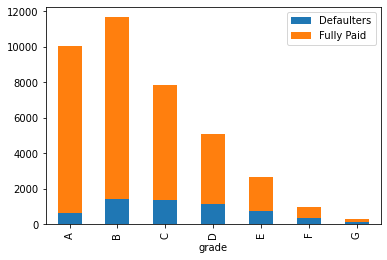

In [46]:
df_def1 = df_def.grade.value_counts().sort_index()
df_fp1 = df_fp.grade.value_counts().sort_index()
df_grade = pd.DataFrame({'Defaulters':df_def1.values,'Fully Paid':df_fp1.values},df_def1.index)
df_grade.plot(kind='bar',stacked=True)

<Axes: xlabel='grade'>

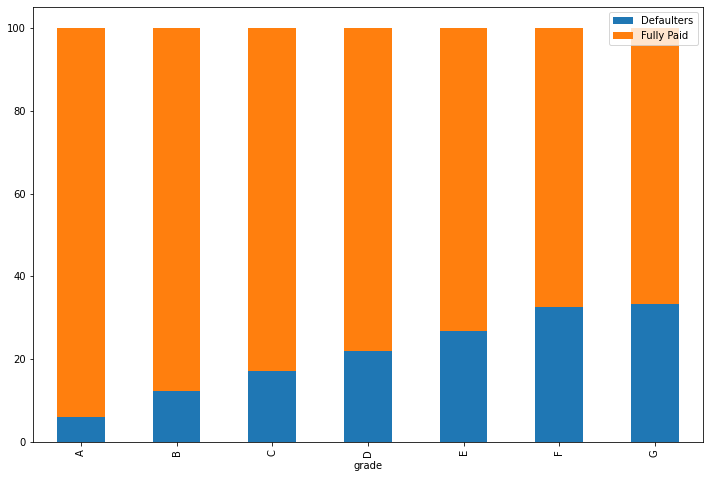

In [47]:
df_grade['Total'] = df_grade.Defaulters + df_grade['Fully Paid']
df_grade = df_grade.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df_grade.plot(kind='bar',stacked=True,figsize=(12,8))


<Axes: xlabel='sub_grade'>

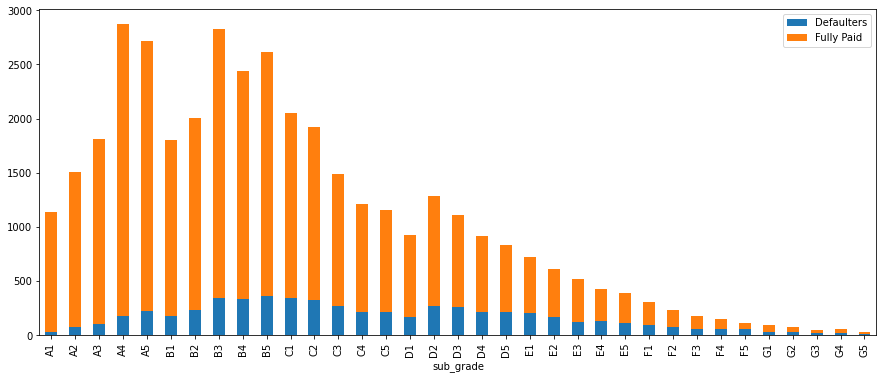

In [48]:
df_def1 = df_def.sub_grade.value_counts().sort_index()
df_fp1 = df_fp.sub_grade.value_counts().sort_index()
df_sub_grade = pd.DataFrame({'Defaulters':df_def1.values,'Fully Paid':df_fp1.values},df_def1.index)
df_sub_grade.plot(kind='bar',stacked=True,figsize=(15,6))

<Axes: xlabel='sub_grade'>

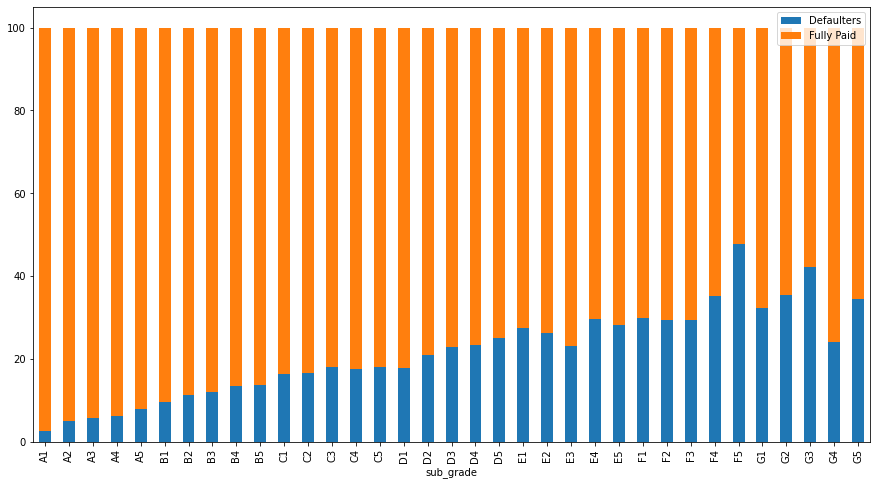

In [49]:
df_sub_grade['Total'] = df_sub_grade.Defaulters + df_sub_grade['Fully Paid']
df_sub_grade = df_sub_grade.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df_sub_grade.plot(kind='bar',stacked=True,figsize=(15,8))


<Axes: xlabel='loan_status', ylabel='installment'>

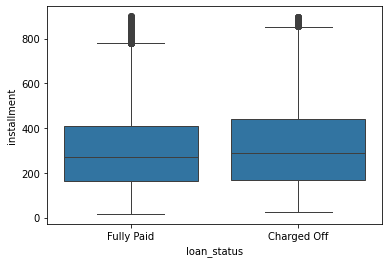

In [50]:
# grade box plot
sns.boxplot(y=df[df.installment < 900].installment,x=df.loan_status)

<Axes: xlabel='loan_status', ylabel='int_rate'>

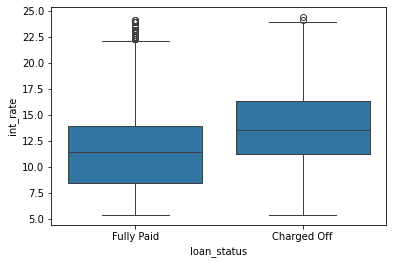

In [51]:
sns.boxplot(y=df.int_rate,x=df.loan_status)

In [52]:
df.int_rate.describe()

count    38527.000000
mean        11.927378
std          3.690161
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
max         24.400000
Name: int_rate, dtype: float64

In [53]:
df['ir_cat'] = pd.cut(df.int_rate,bins=[5.00,9.25,14.54,25],labels=['low','medium','high'])
df_def = df[df['loan_status'] == 'Charged Off']
df_fp = df[df['loan_status'] == 'Fully Paid']

<Axes: xlabel='ir_cat'>

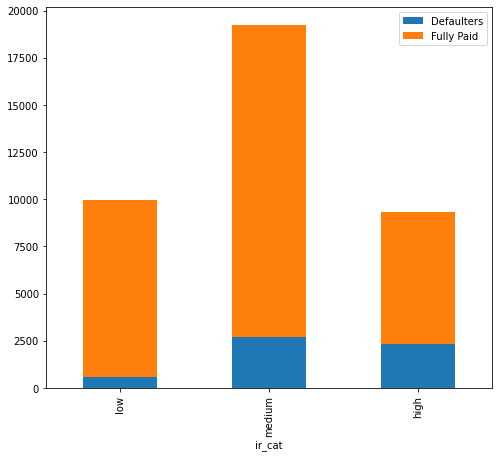

In [54]:
df_ir_cat =  pd.DataFrame({'Defaulters':df_def.ir_cat.value_counts().sort_index().values,'Fully Paid':df_fp.ir_cat.value_counts().sort_index().values},df_fp.ir_cat.value_counts().sort_index().index)
df_ir_cat.plot(kind='bar',stacked=True,figsize=(8,7))

<Axes: xlabel='ir_cat'>

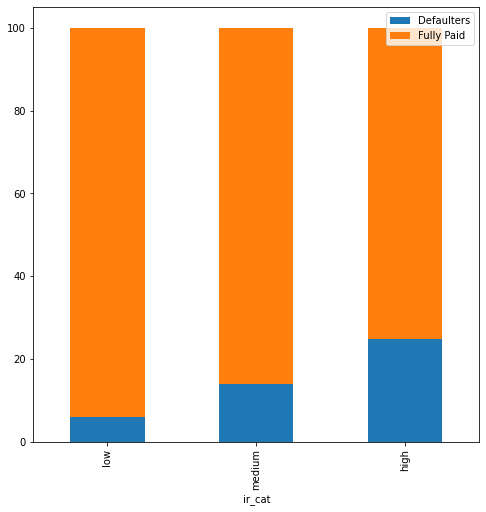

In [55]:
df_ir_cat['Total'] = df_ir_cat.Defaulters + df_ir_cat['Fully Paid']
df_ir_cat = df_ir_cat.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df_ir_cat.plot(kind='bar',stacked=True,figsize=(8,8))

<Axes: xlabel='loan_status', ylabel='loan_amnt'>

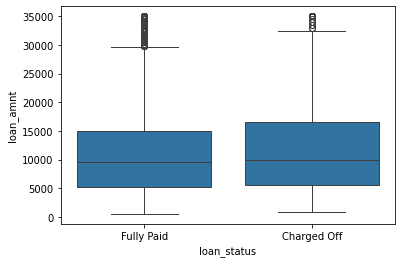

In [56]:
sns.boxplot(y=df.loan_amnt,x=df.loan_status)

<Axes: xlabel='term'>

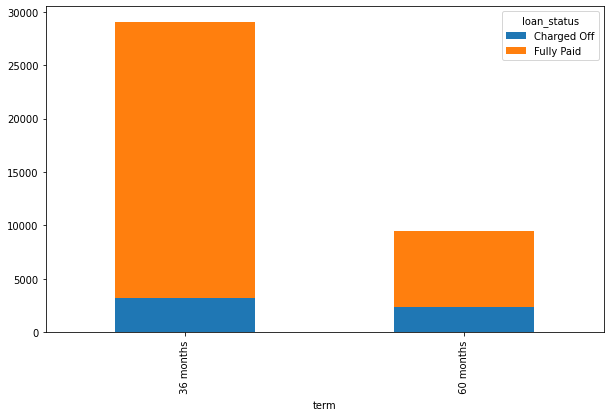

In [57]:
df1 = df.groupby(['term','loan_status']).count().reset_index()
pd.pivot_table(df1,values='int_rate',index='term',columns='loan_status',aggfunc='max',fill_value=0).plot(kind='bar',stacked=True,figsize=(10,6))

<Axes: xlabel='loan_status', ylabel='loan_amnt'>

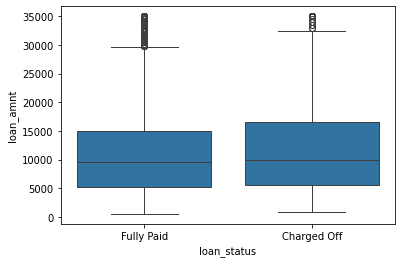

In [58]:
sns.boxplot(x='loan_status', y='loan_amnt', data=df)


ca = ['emp_title','emp_length','home_ownership','verification_status','purpose','title','zip_code', <bR>
'addr_state','dti','delinq_2yrs','earliest_cr_line','inq_last_6mths',<br>
'open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies']


In [59]:
df1 = pd.pivot_table(df.groupby(['purpose','loan_status']).count(),values='int_rate',index='purpose',columns='loan_status',aggfunc='max')
df1

loan_status,Charged Off,Fully Paid
purpose,,
car,159,1338
credit_card,541,4484
debt_consolidation,2762,15281
educational,56,266
home_improvement,344,2526
house,59,308
major_purchase,221,1923
medical,105,574
moving,92,482


<Axes: xlabel='purpose'>

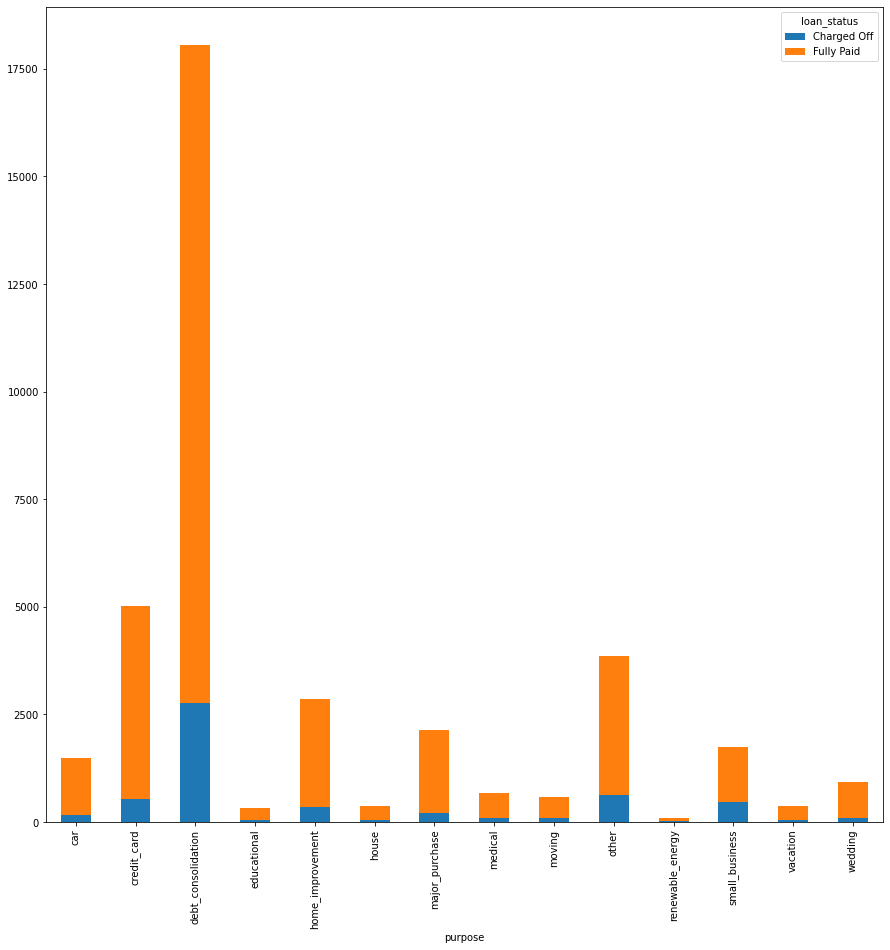

In [60]:
df1.plot(kind='bar',stacked=True,figsize=(15,15))

In [61]:
df1 = pd.pivot_table(df.groupby(['addr_state','loan_status']).count(),values='int_rate',index='addr_state',columns='loan_status',aggfunc='max')
df1

loan_status,Charged Off,Fully Paid
addr_state,,
AK,15.0,63.0
AL,53.0,381.0
AR,27.0,207.0
AZ,122.0,724.0
CA,1124.0,5818.0
CO,98.0,668.0
CT,94.0,632.0
DC,15.0,194.0
DE,11.0,101.0


<Axes: xlabel='addr_state'>

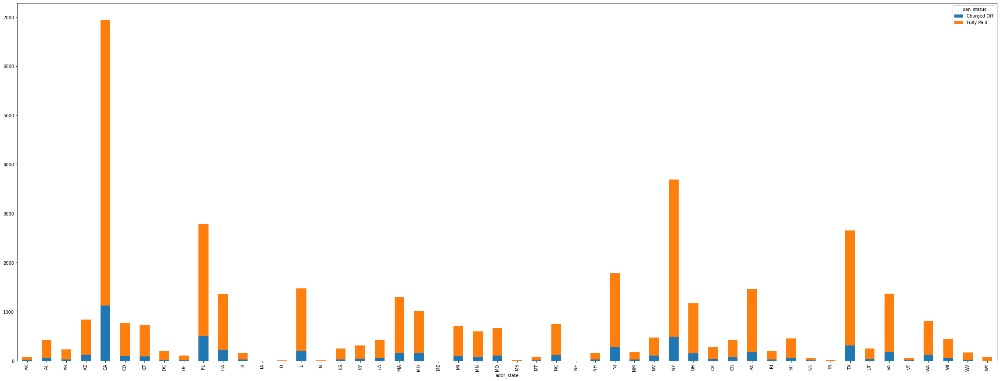

In [62]:
df1.plot(kind='bar',stacked=True,figsize=(40,15))

<Axes: xlabel='addr_state'>

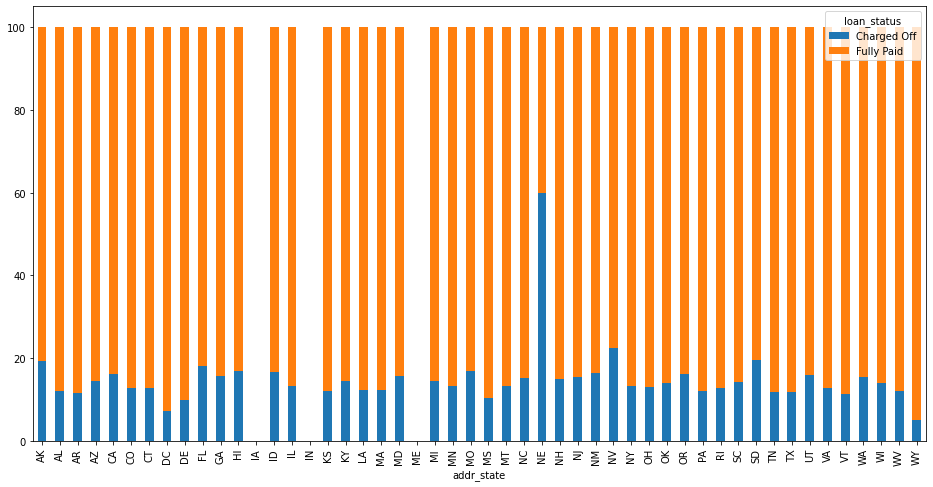

In [63]:
df1['Total'] = df1['Charged Off'] + df1['Fully Paid']
df1 = df1.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df1.plot(kind='bar',stacked=True,figsize=(16,8))

In [64]:
df.emp_length = df.emp_length.str.rstrip(' year').str.rstrip(' years').str.replace('10+','15').replace('< 1','0.5').str.strip(' ').fillna('0').astype('float')


In [65]:
df.emp_length.value_counts()

emp_length
15.0    8487
0.5     4496
2.0     4286
3.0     4008
4.0     3335
5.0     3190
1.0     3163
6.0     2165
7.0     1708
8.0     1433
9.0     1226
0.0     1030
Name: count, dtype: int64

<Axes: xlabel='emp_length'>

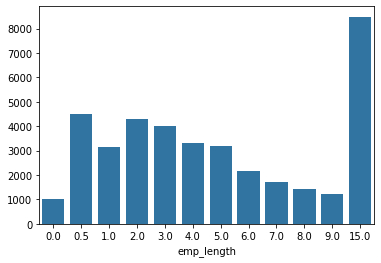

In [66]:
sns.barplot(x=df['emp_length'].value_counts().index, y=df['emp_length'].value_counts().values)


In [67]:
df1 = pd.pivot_table(df.groupby(['emp_length','loan_status']).count(),values='int_rate',index='emp_length',columns='loan_status',aggfunc='max')


<Axes: xlabel='emp_length'>

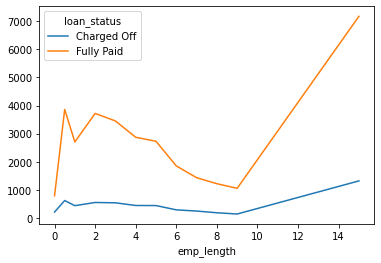

In [68]:
df1.plot()

<Axes: xlabel='emp_length'>

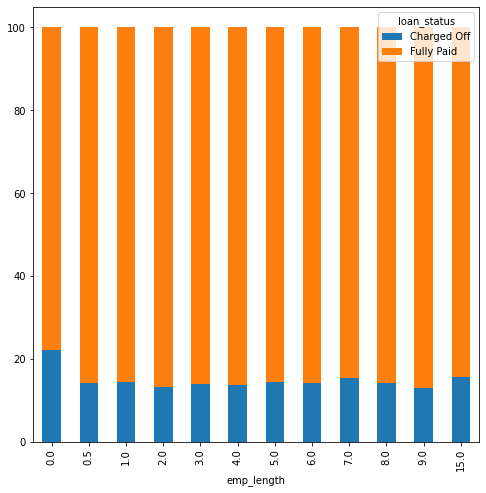

In [69]:
df1['Total'] = df1['Charged Off'] + df1['Fully Paid']
df1 = df1.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df1.plot(kind='bar',stacked=True,figsize=(8,8))

In [70]:
df1 = pd.pivot_table(df.groupby(['home_ownership','loan_status']).count(),values='int_rate',index='home_ownership',columns='loan_status',aggfunc='max')
df1


loan_status,Charged Off,Fully Paid
home_ownership,,
MORTGAGE,2323.0,14687.0
NONE,NaN,3.0
OTHER,18.0,78.0
OWN,441.0,2529.0
RENT,2829.0,15619.0


<Axes: xlabel='home_ownership'>

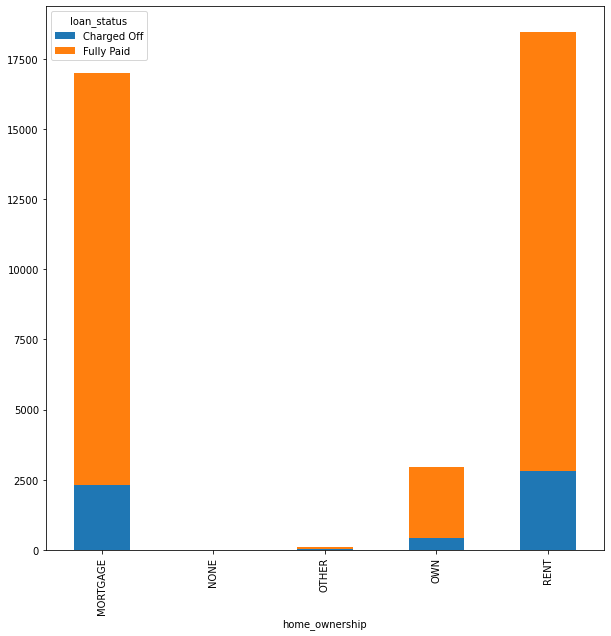

In [71]:
df1.plot(kind='bar',stacked=True,figsize=(10,10))

<Axes: xlabel='home_ownership'>

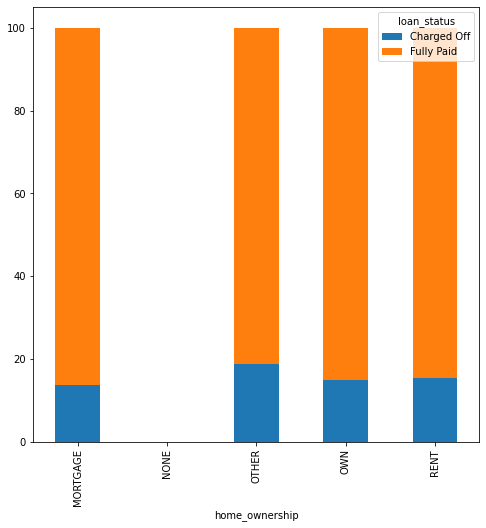

In [72]:
df1['Total'] = df1['Charged Off'] + df1['Fully Paid']
df1 = df1.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df1.plot(kind='bar',stacked=True,figsize=(8,8))

In [73]:
df1 = pd.pivot_table(df.groupby(['verification_status','loan_status']).count(),values='int_rate',index='verification_status',columns='loan_status',aggfunc='max')
df1



loan_status,Charged Off,Fully Paid
verification_status,,
Not Verified,2135,14530
Source Verified,1431,8235
Verified,2045,10151


<Axes: xlabel='verification_status'>

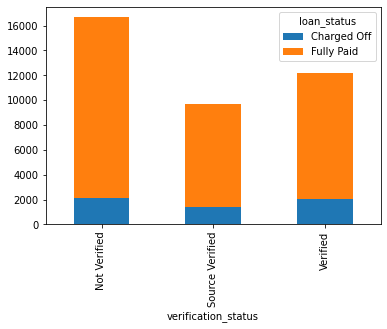

In [74]:
df1.plot(kind='bar',stacked=True)

In [75]:
df.addr_state.value_counts()

addr_state
CA    6942
NY    3697
FL    2780
TX    2655
NJ    1785
IL    1477
PA    1464
VA    1368
GA    1359
MA    1296
OH    1174
MD    1021
AZ     846
WA     817
CO     766
NC     749
CT     726
MI     704
MO     669
MN     603
NV     478
SC     459
WI     439
AL     434
OR     434
LA     427
KY     311
OK     287
KS     254
UT     252
AR     234
DC     209
RI     194
NM     183
WV     172
NH     166
HI     165
DE     112
MT      83
WY      80
AK      78
SD      61
VT      53
MS      19
TN      17
IN       9
ID       6
IA       5
NE       5
ME       3
Name: count, dtype: int64

<Axes: xlabel='loan_status', ylabel='dti'>

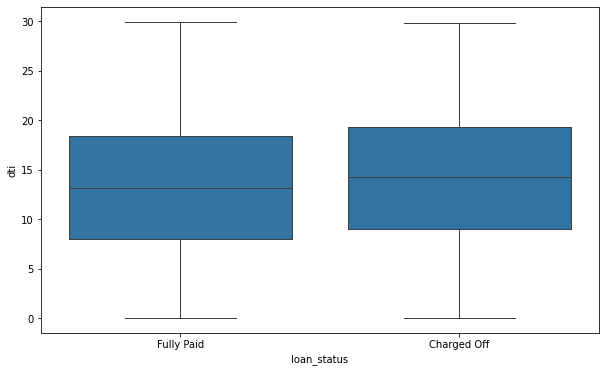

In [76]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='loan_status', y='dti', data=df)

<Axes: xlabel='loan_status', ylabel='pub_rec_bankruptcies'>

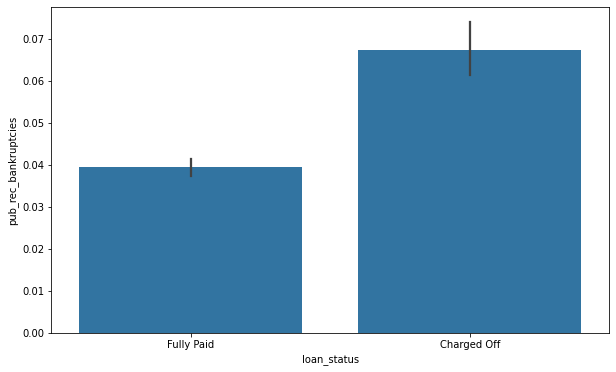

In [77]:
plt.figure(figsize=(10, 6))
sns.barplot(x='loan_status', y='pub_rec_bankruptcies', data=df)

<Axes: xlabel='loan_status', ylabel='revol_util'>

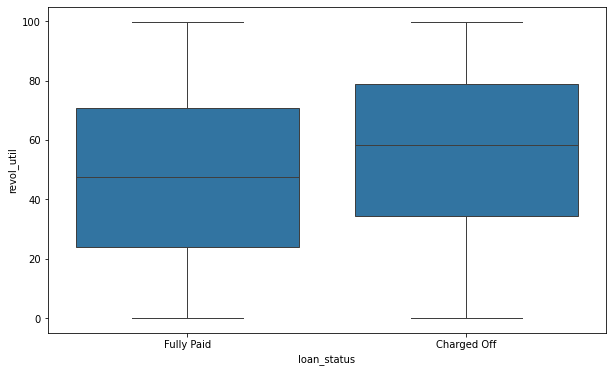

In [78]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='loan_status', y='revol_util', data=df)


<Axes: xlabel='loan_status', ylabel='pub_rec'>

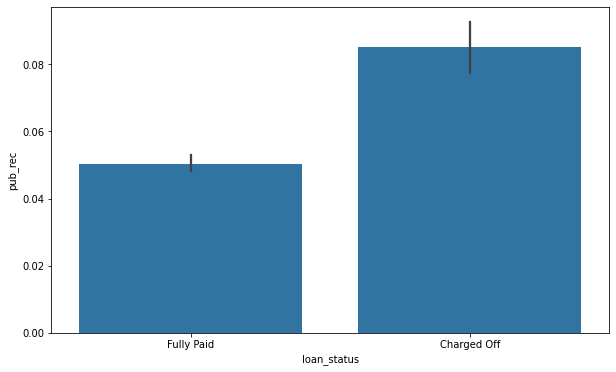

In [79]:
plt.figure(figsize=(10, 6))
sns.barplot(x='loan_status', y='pub_rec', data=df)


<Axes: xlabel='loan_status', ylabel='open_acc'>

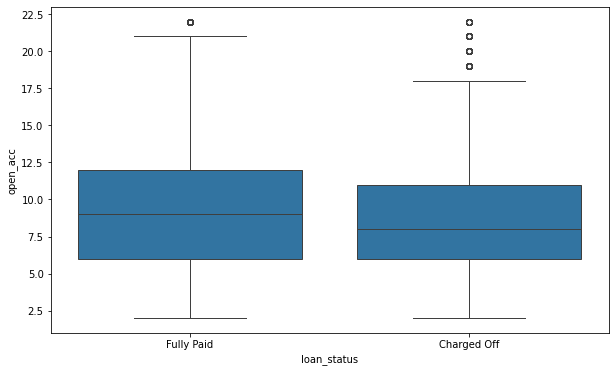

In [80]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='loan_status', y=df[df.open_acc <23]['open_acc'], data=df)

In [81]:
df['yrint'] =df['year'].astype('int')

In [82]:
df_num = df[['dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies','loan_amnt','int_rate','installment','yrint']]

In [83]:
df_num.corr()

,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,loan_amnt,int_rate,installment,yrint
dti,1.000000,-0.033500,0.001941,0.287996,-0.004870,0.227936,0.278941,0.228868,0.005686,0.061899,0.111629,0.051497,-0.032145
delinq_2yrs,-0.033500,1.000000,0.008742,0.011797,0.007708,-0.055127,-0.042616,0.066988,0.003456,-0.031998,0.158673,-0.019801,-0.064214
inq_last_6mths,0.001941,0.008742,1.000000,0.093615,0.023820,-0.020753,-0.070206,0.113659,0.015511,0.012902,0.133439,0.010981,-0.013513
open_acc,0.287996,0.011797,0.093615,1.000000,-0.000027,0.287420,-0.089923,0.687034,0.005700,0.176318,0.007607,0.172105,-0.197019
pub_rec,-0.004870,0.007708,0.023820,-0.000027,1.000000,-0.060612,0.058942,-0.023611,0.846057,-0.050140,0.098941,-0.045839,-0.037352
revol_bal,0.227936,-0.055127,-0.020753,0.287420,-0.060612,1.000000,0.301248,0.311990,-0.048723,0.313514,0.095308,0.309048,-0.232033
revol_util,0.278941,-0.042616,-0.070206,-0.089923,0.058942,0.301248,1.000000,-0.070650,0.060316,0.063489,0.467213,0.093049,0.039633
total_acc,0.228868,0.066988,0.113659,0.687034,-0.023611,0.311990,-0.070650,1.000000,-0.011189,0.255242,-0.045173,0.228947,-0.337386
pub_rec_bankruptcies,0.005686,0.003456,0.015511,0.005700,0.846057,-0.048723,0.060316,-0.011189,1.000000,-0.036150,0.083206,-0.033520,-0.046388
loan_amnt,0.061899,-0.031998,0.012902,0.176318,-0.050140,0.313514,0.063489,0.255242,-0.036150,1.000000,0.302810,0.932187,-0.165803


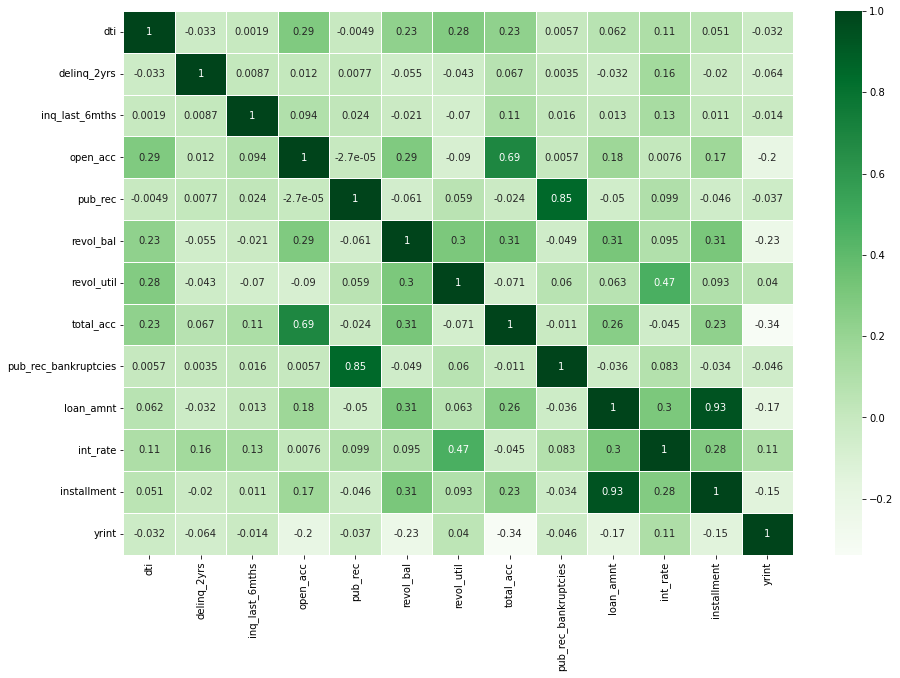

In [84]:
plt.figure(figsize=(15,10))
sns.heatmap(df_num.corr(),annot=True,cmap="Greens",linewidths=1)
plt.show()

In [85]:
df_def = df[df['loan_status'] == 'Charged Off']
df_fp = df[df['loan_status'] == 'Fully Paid']

In [86]:
df_def_num = df_def[['dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies','loan_amnt','int_rate','installment','yrint']]
df_def_num.corr()

,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,loan_amnt,int_rate,installment,yrint
dti,1.000000,-0.068718,-0.029837,0.299920,0.007812,0.239787,0.227279,0.273116,0.018755,0.063194,0.041453,0.041582,-0.050438
delinq_2yrs,-0.068718,1.000000,-0.012634,-0.018203,-0.001584,-0.082120,-0.101581,0.059916,0.002485,-0.029928,0.120040,-0.012665,-0.047968
inq_last_6mths,-0.029837,-0.012634,1.000000,0.079385,0.013101,-0.010923,-0.136233,0.103408,0.008588,0.007254,0.058344,0.018220,-0.028419
open_acc,0.299920,-0.018203,0.079385,1.000000,0.048888,0.328668,-0.056673,0.685712,0.060581,0.182227,0.041126,0.177778,-0.176420
pub_rec,0.007812,-0.001584,0.013101,0.048888,1.000000,-0.064445,0.058880,0.015525,0.863000,-0.048471,0.079798,-0.041771,-0.047823
revol_bal,0.239787,-0.082120,-0.010923,0.328668,-0.064445,1.000000,0.284387,0.361425,-0.050944,0.311783,0.077821,0.298722,-0.229490
revol_util,0.227279,-0.101581,-0.136233,-0.056673,0.058880,0.284387,1.000000,-0.023342,0.065620,0.042634,0.379245,0.074084,-0.006834
total_acc,0.273116,0.059916,0.103408,0.685712,0.015525,0.361425,-0.023342,1.000000,0.030923,0.282037,-0.006725,0.250238,-0.317074
pub_rec_bankruptcies,0.018755,0.002485,0.008588,0.060581,0.863000,-0.050944,0.065620,0.030923,1.000000,-0.028974,0.075481,-0.026235,-0.055854
loan_amnt,0.063194,-0.029928,0.007254,0.182227,-0.048471,0.311783,0.042634,0.282037,-0.028974,1.000000,0.353618,0.925734,-0.170688


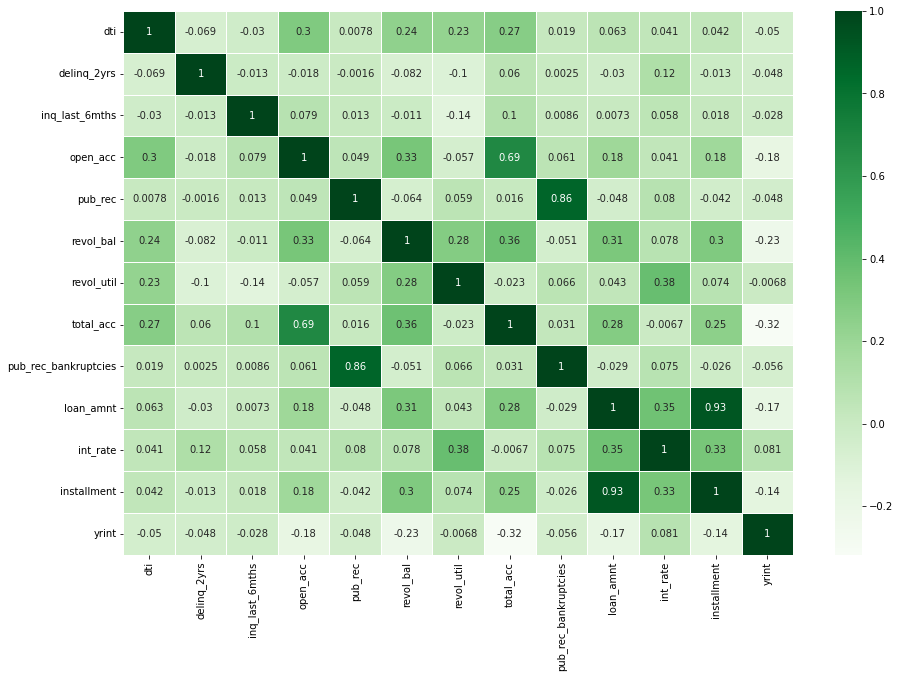

In [87]:
plt.figure(figsize=(15,10))
sns.heatmap(df_def_num.corr(),annot=True,cmap="Greens",linewidths=1)
plt.show()

In [88]:
df_fp_num = df_fp[['dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies','loan_amnt','int_rate','installment','yrint']]
df_fp_num.corr()

,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,loan_amnt,int_rate,installment,yrint
dti,1.000000,-0.028118,0.003948,0.286765,-0.010387,0.226007,0.284192,0.222916,0.000272,0.058716,0.115350,0.051875,-0.030243
delinq_2yrs,-0.028118,1.000000,0.011437,0.017837,0.008643,-0.050567,-0.034358,0.068935,0.002584,-0.033976,0.165383,-0.021892,-0.067950
inq_last_6mths,0.003948,0.011437,1.000000,0.097389,0.021901,-0.023138,-0.067315,0.117915,0.013055,0.008915,0.133308,0.007224,-0.012650
open_acc,0.286765,0.017837,0.097389,1.000000,-0.010259,0.280758,-0.095272,0.687322,-0.006176,0.176237,0.003927,0.171416,-0.200578
pub_rec,-0.010387,0.008643,0.021901,-0.010259,1.000000,-0.060721,0.053420,-0.030730,0.841036,-0.054620,0.092863,-0.048713,-0.036691
revol_bal,0.226007,-0.050567,-0.023138,0.280758,-0.060721,1.000000,0.304988,0.304300,-0.049101,0.314733,0.099152,0.310958,-0.232790
revol_util,0.284192,-0.034358,-0.067315,-0.095272,0.053420,0.304988,1.000000,-0.076478,0.054093,0.060838,0.472282,0.093743,0.045226
total_acc,0.222916,0.068935,0.117915,0.687322,-0.030730,0.304300,-0.076478,1.000000,-0.019224,0.252568,-0.047498,0.226055,-0.340562
pub_rec_bankruptcies,0.000272,0.002584,0.013055,-0.006176,0.841036,-0.049101,0.054093,-0.019224,1.000000,-0.041609,0.075053,-0.036839,-0.045907
loan_amnt,0.058716,-0.033976,0.008915,0.176237,-0.054620,0.314733,0.060838,0.252568,-0.041609,1.000000,0.286679,0.934307,-0.166994


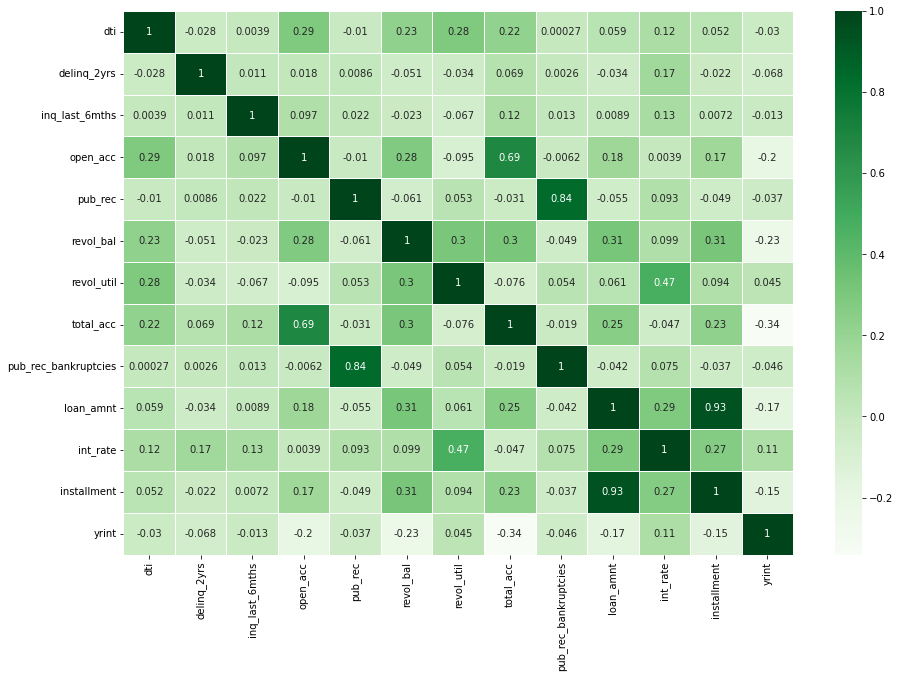

In [89]:
plt.figure(figsize=(15,10))
sns.heatmap(df_fp_num.corr(),annot=True,cmap="Greens",linewidths=1)
plt.show()

ca = ['emp_title','emp_length','home_ownership','verification_status','purpose','title','zip_code',
'addr_state','dti','delinq_2yrs','earliest_cr_line','inq_last_6mths',
'open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies']

lets compare with each other

In [90]:
df_num = df[['dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','pub_rec_bankruptcies','loan_amnt','int_rate','installment','yrint','loan_status']]


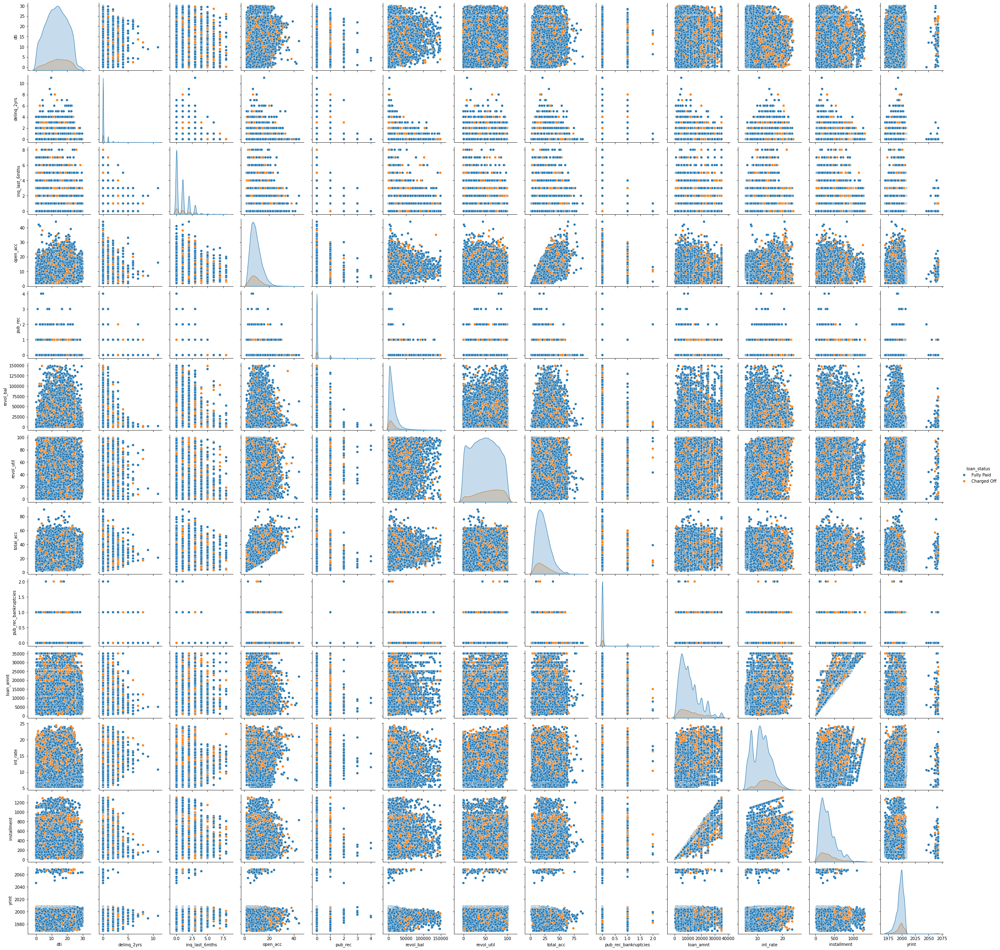

In [91]:
sns.pairplot(df_num,hue='loan_status')

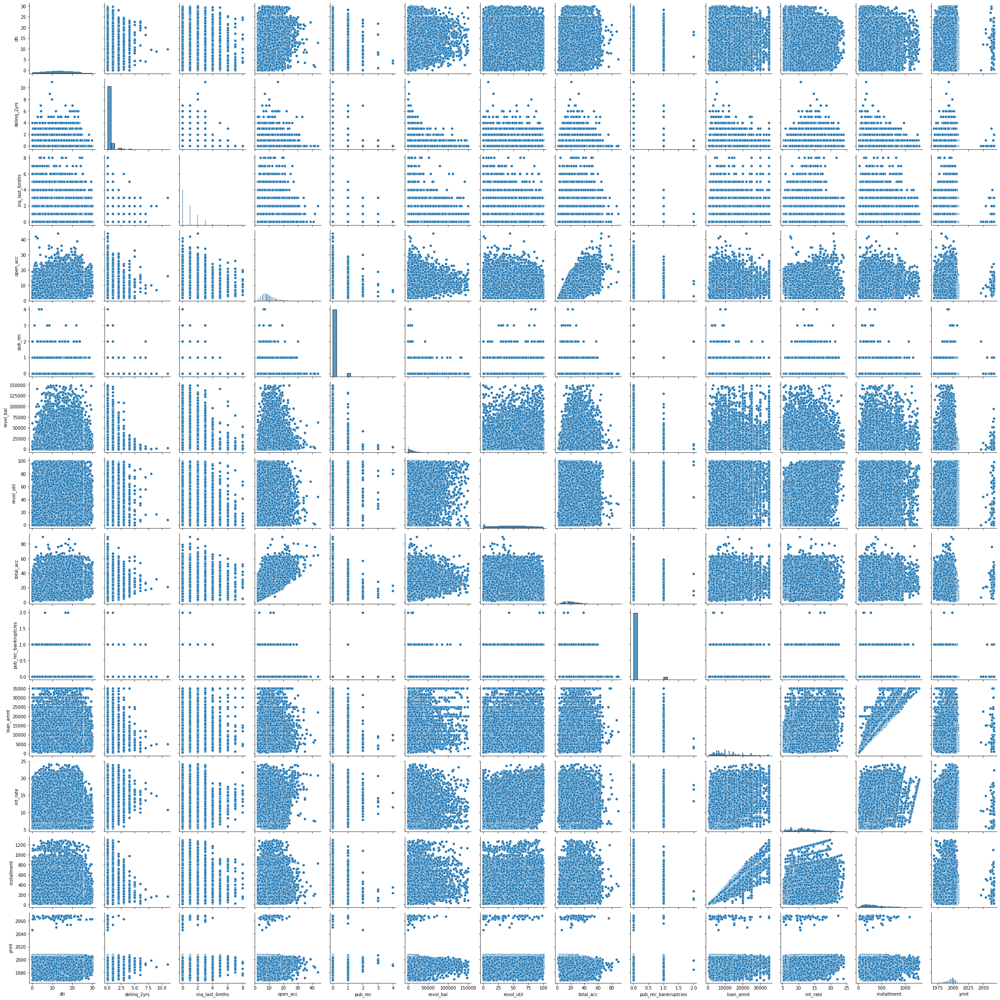

In [92]:
sns.pairplot(df_fp_num)

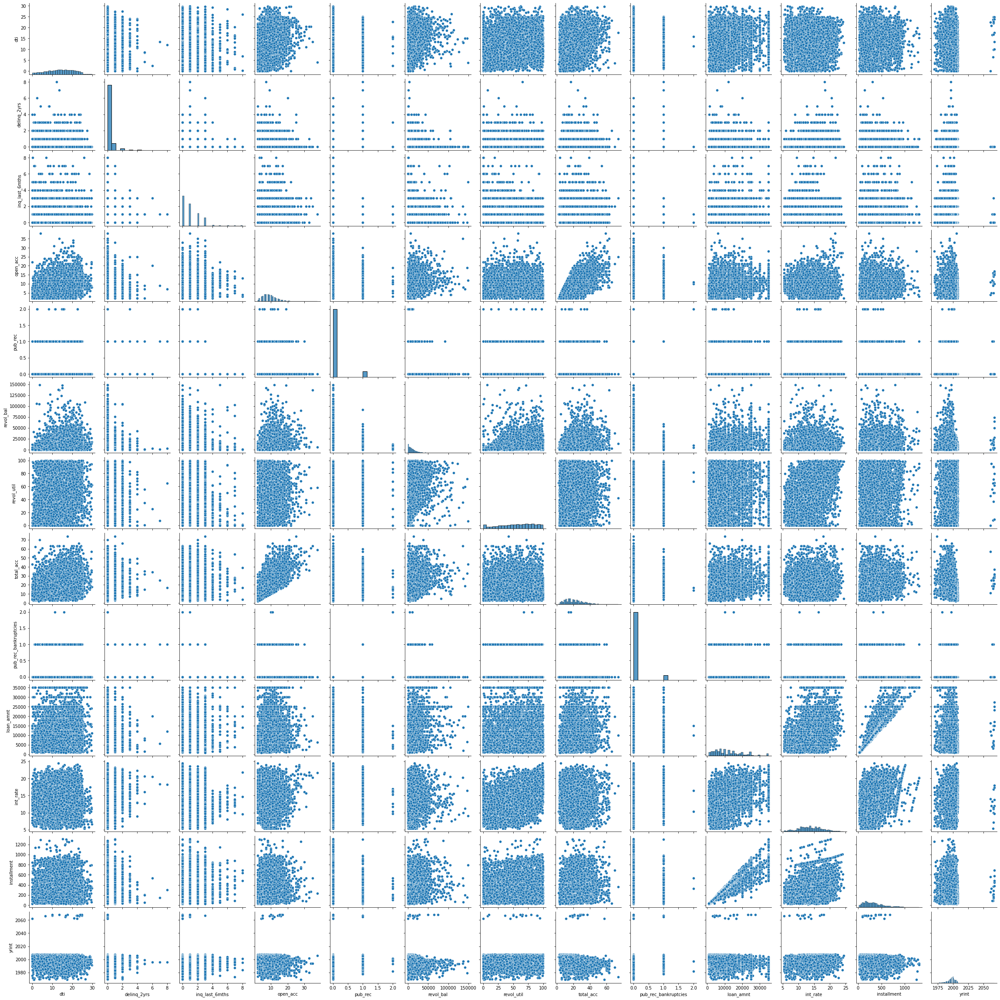

In [93]:
sns.pairplot(df_def_num)

In [94]:
df.year.value_counts().sort_index()

year
1969      37
1970      47
1971      45
1972      49
1973      61
1974      62
1975      83
1976      93
1977     112
1978     161
1979     157
1980     175
1981     181
1982     215
1983     322
1984     395
1985     439
1986     478
1987     590
1988     709
1989     833
1990    1005
1991     945
1992    1028
1993    1460
1994    1944
1995    2076
1996    2200
1997    2384
1998    2772
1999    2895
2000    3159
2001    2459
2002    1887
2003    1808
2004    1722
2005    1460
2006    1146
2007     696
2008     152
2046       1
2050       1
2054       2
2056       1
2059       1
2061       2
2062       5
2063      10
2064       6
2065       8
2066      11
2067      18
2068      19
Name: count, dtype: int64

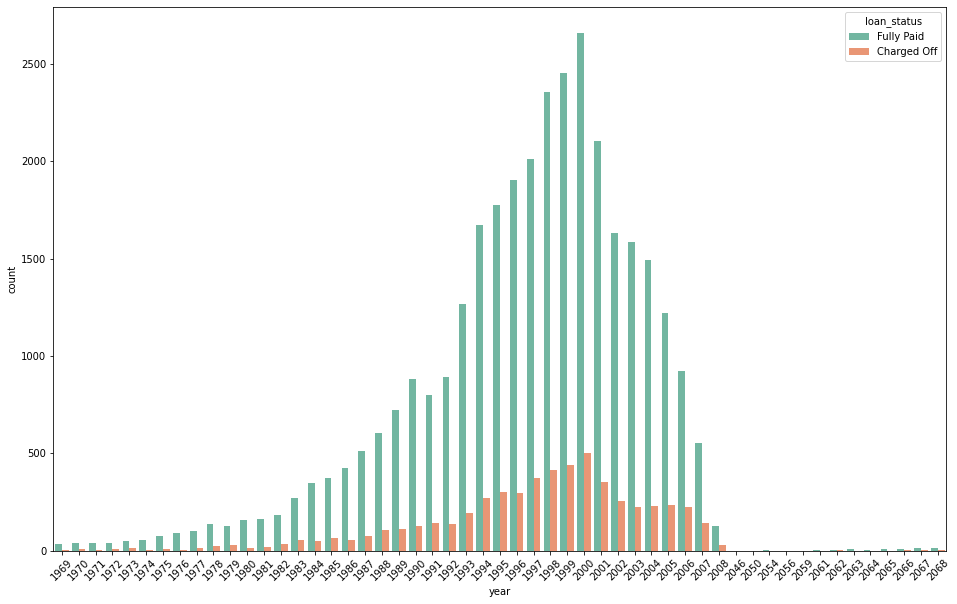

In [95]:
plt.figure(figsize=(16, 10))
sns.countplot(x=df['year'] , hue='loan_status', data=df, palette='Set2')
plt.xticks(rotation=45)
plt.show()

<Axes: xlabel='year'>

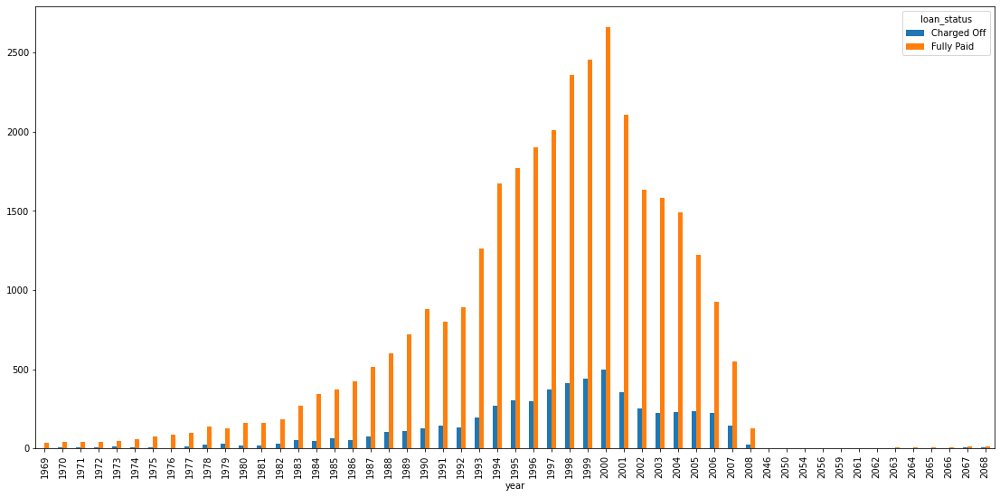

In [96]:
df1 = pd.pivot_table(df.groupby(['year','loan_status']).count(),values='int_rate',index='year',columns='loan_status',aggfunc='max')
df1.plot(kind='bar',figsize=(19,9))

<Axes: xlabel='year'>

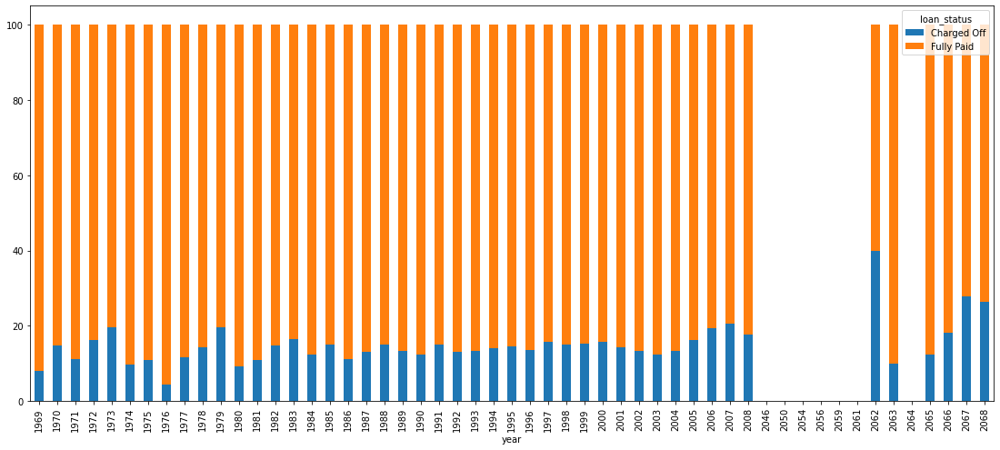

In [97]:
df1['Total'] = df1['Charged Off'] + df1['Fully Paid']
df1 = df1.apply(lambda x: x.apply(lambda y: y*100/x['Total']) ,axis = 1).drop(['Total'],axis=1)
df1.plot(kind='bar',stacked=True,figsize=(19,8))